In [3]:
import cv2
from google.colab.patches import cv2_imshow
import h5py
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader

In [100]:
!git clone https://github.com/Omid-Nejati/MedViT.git
!git clone https://github.com/este6an13/ss-nn-classification.git

Cloning into 'MedViT'...
remote: Enumerating objects: 46, done.
remote: Counting objects: 100% (46/46), done.
remote: Compressing objects: 100% (40/40), done.
remote: Total 46 (delta 12), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (46/46), 765.00 KiB | 9.93 MiB/s, done.
Resolving deltas: 100% (12/12), done.
Cloning into 'ss-nn-classification'...
remote: Enumerating objects: 5, done.
remote: Total 5 (delta 0), reused 0 (delta 0), pack-reused 5
Receiving objects: 100% (5/5), 111.43 MiB | 30.61 MiB/s, done.


In [101]:
cd /content/MedViT

/content/MedViT


In [ ]:
!pip install timm
!pip install einops

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 25.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.7/311.7 kB 38.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 89.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 1.1 MB/s eta 0:00:00


In [ ]:
from MedViT import MedViT_large as large

model = large(pretrained=True)
model = model.cuda()

initialize_weights...


In [102]:
cd /content

/content


In [105]:
def load_data_from_h5(h5_path):
    image_arrays = []
    with h5py.File(h5_path, 'r') as hf:
        keys = list(hf.keys())
        num_images = min(100, len(keys))  # Read up to 100 images per class

        for i in range(num_images):
            image_data = hf[keys[i]][()]
            image_arrays.append(image_data)
    images = np.array(image_arrays)
    return images

def generate_tensor_from_h5(h5_path):
    images = load_data_from_h5(h5_path)
    # To get input shape (n, 3, 512, 512)
    tensor = images.transpose(0, 3, 1, 2)
    tensor = torch.from_numpy(tensor).float()
    return tensor

syndrome_tensor = generate_tensor_from_h5('ss-nn-classification/data/syndrome_data.h5')
non_syndrome_tensor = generate_tensor_from_h5('ss-nn-classification/data/non_syndrome_data.h5')

print("Shape of syndrome tensor:", syndrome_tensor.shape)
print("Shape of non-syndrome tensor:", non_syndrome_tensor.shape)

Shape of syndrome tensor: torch.Size([100, 3, 512, 512])
Shape of non-syndrome tensor: torch.Size([100, 3, 512, 512])


In [ ]:
import torch.nn as nn
import torch

class MedViTFeatureExtractor(nn.Module):
    def __init__(self, model):
        super(MedViTFeatureExtractor, self).__init__()

        self.stem = model.stem
        self.features = model.features
        self.norm = model.norm
        self.avgpool = model.avgpool

    def forward(self, x):
        features = []

        x = self.stem(x)

        with torch.no_grad():
            for layer in self.features:
                x = layer(x)
            x = self.norm(x)
            x = self.avgpool(x)

            features.append(x.clone())

        return features

feature_extractor = MedViTFeatureExtractor(model)

feature_extractor.eval()

def persist_features(features, filename):
    with h5py.File(filename, 'w') as hf:
        hf.create_dataset('features', data=features.cpu().detach().numpy())

In [ ]:
syndrome_extracted_features = feature_extractor(nn.functional.normalize(syndrome_tensor[75:100], p=2, dim=1).to('cuda'))
persist_features(syndrome_extracted_features[-1], 'syndrome_features_03.h5')
print(syndrome_extracted_features[-1].shape)

torch.Size([25, 1024, 1, 1])


In [ ]:
non_syndrome_extracted_features = feature_extractor(nn.functional.normalize(non_syndrome_tensor[75:100], p=2, dim=1).to('cuda'))
persist_features(non_syndrome_extracted_features[-1], 'non_syndrome_features_03.h5')
print(non_syndrome_extracted_features[-1].shape)

torch.Size([25, 1024, 1, 1])


In [ ]:
# Function to load features from multiple HDF5 files
def load_features(file_pattern, num_files):
    all_features = []
    for i in range(0, num_files):
        file_path = f'{file_pattern}_{str(i).zfill(2)}.h5'
        with h5py.File(file_path, 'r') as hf:
            features = np.array(hf['features'])
        all_features.append(features)
    return np.concatenate(all_features, axis=0)

# Load syndrome and non-syndrome features
syndrome_features = load_features('syndrome_features', 4)
non_syndrome_features = load_features('non_syndrome_features', 4)

print(syndrome_features.shape)
print(non_syndrome_features.shape)

def _persist_features(features, filename):
    with h5py.File(filename, 'w') as hf:
        hf.create_dataset('features', data=features)

_persist_features(syndrome_features, 'syndrome_features.h5')
_persist_features(non_syndrome_features, 'non_syndrome_features.h5')

(100, 1024, 1, 1)
(100, 1024, 1, 1)


In [16]:
def load_features(file_path):
    with h5py.File(file_path, 'r') as hf:
        features = np.array(hf['features'])
    return features

syndrome_features = load_features('syndrome_features.h5')
non_syndrome_features = load_features('non_syndrome_features.h5')

print(syndrome_features.shape)
print(non_syndrome_features.shape)

(100, 1024, 1, 1)
(100, 1024, 1, 1)


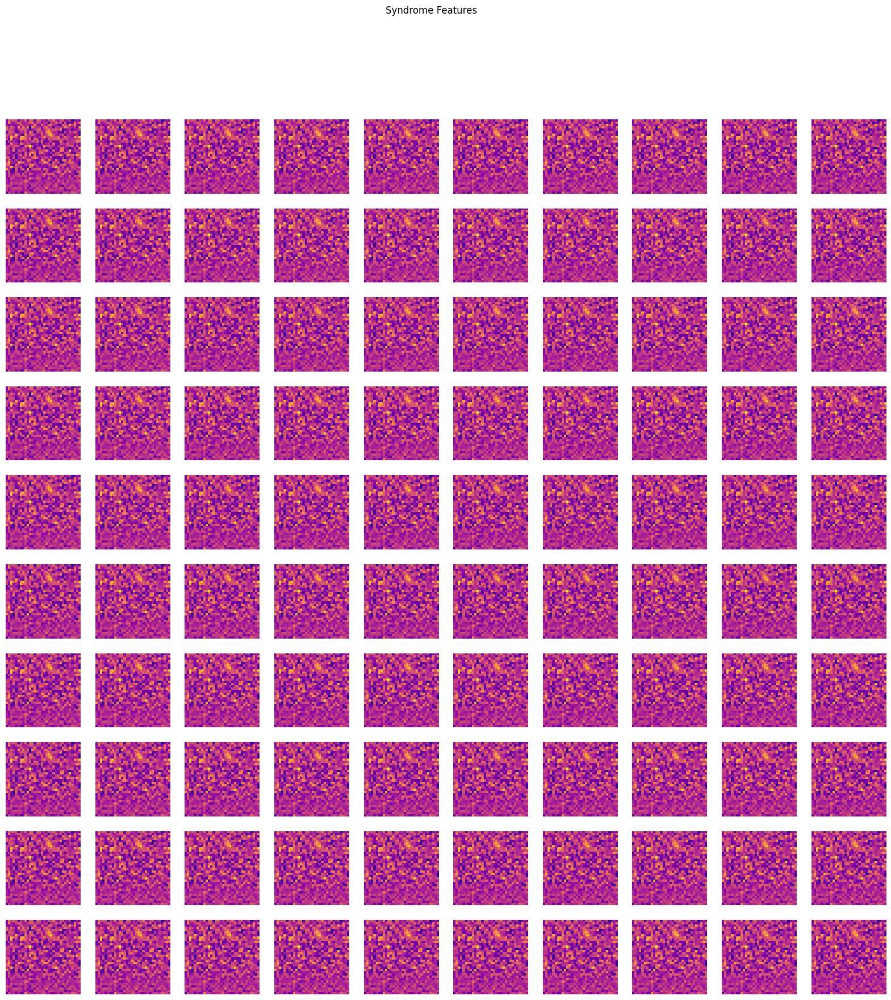

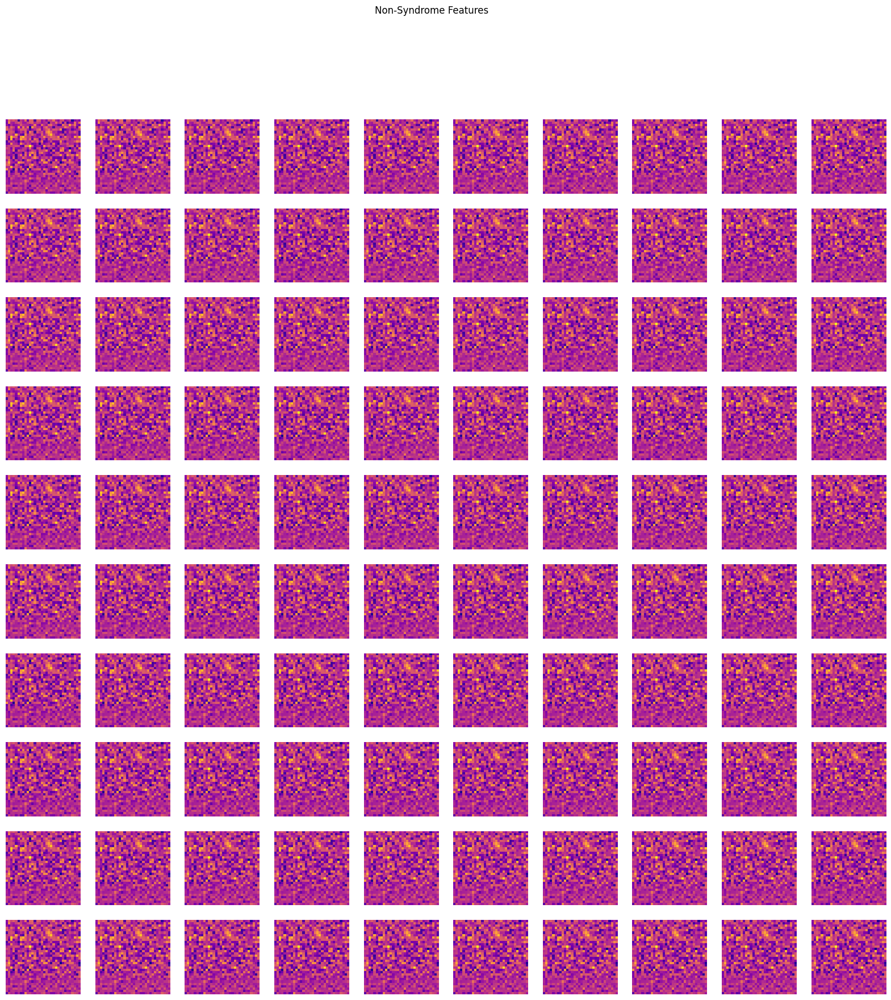

In [118]:
# Function to reshape and plot the images in a grid
def plot_image_grid(data_array, title):
    num_images = data_array.shape[0]
    grid_size = int(np.ceil(np.sqrt(num_images)))

    fig, axes = plt.subplots(grid_size, grid_size, figsize=(20, 20))
    fig.suptitle(title)

    for i in range(grid_size * grid_size):
        if i < num_images:
            image = data_array[i].reshape(32, 32)
            ax = axes[i // grid_size, i % grid_size]
            ax.imshow(image, cmap='plasma', aspect='auto')
            ax.axis('off')
        else:
            axes[i // grid_size, i % grid_size].axis('off')

    plt.show()

# Plotting the syndrome array
plot_image_grid(syndrome_features, title='Syndrome Features')

# Plotting the non-syndrome array
plot_image_grid(non_syndrome_features, title='Non-Syndrome Features')

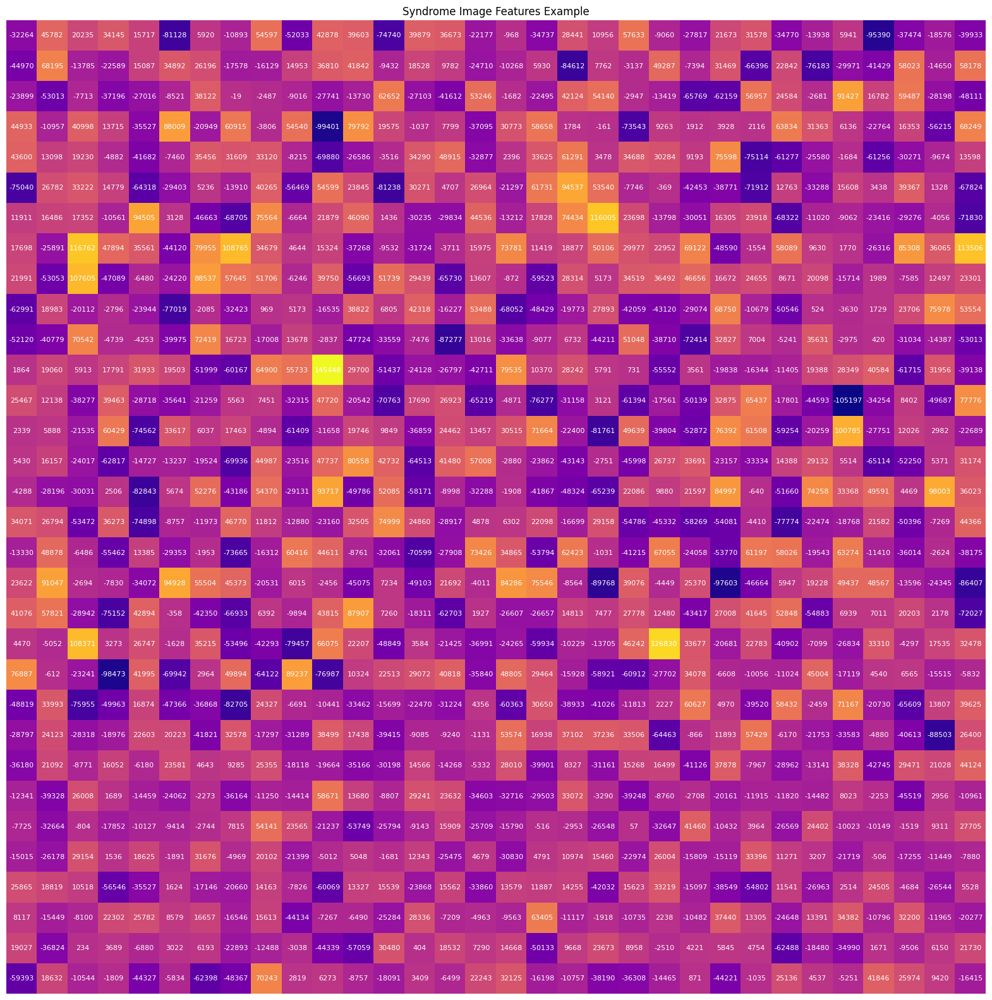

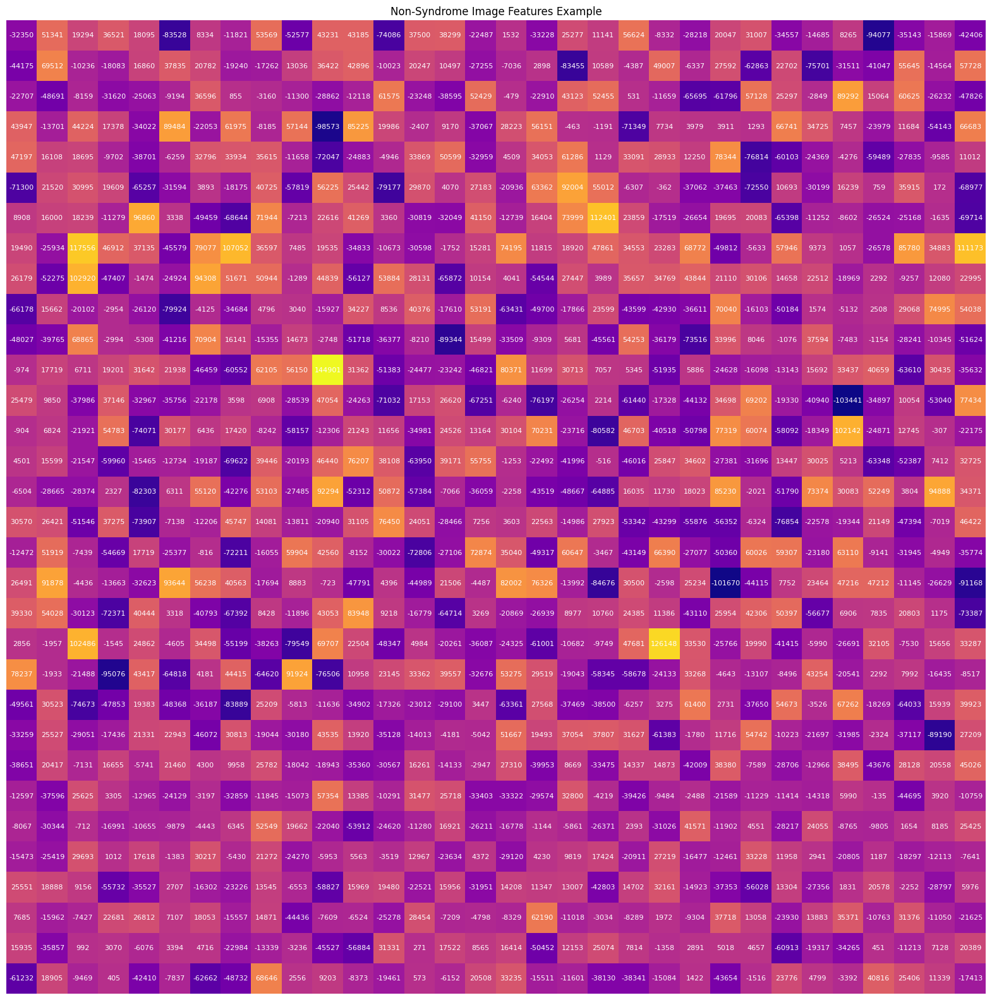

In [119]:
def plot_single_image(data_array, index, title):
    # Assuming that data_array is of shape (100, 1024, 1, 1)
    image = data_array[index].reshape(32, 32)

    plt.figure(figsize=(20, 20))
    plt.imshow(image, cmap='plasma', aspect='auto')

    # Add numerical values as text annotations
    for i in range(32):
        for j in range(32):
            plt.text(j, i, f'{int(image[i, j])}', color='white',
                     ha='center', va='center', fontsize=8)

    plt.title(title)
    plt.axis('off')
    plt.show()

# Plot a single image from the syndrome array (change the index as needed)
plot_single_image(syndrome_features, index=0, title='Syndrome Image Features Example')

# Plot a single image from the non-syndrome array (change the index as needed)
plot_single_image(non_syndrome_features, index=0, title='Non-Syndrome Image Features Example')

In [17]:
import numpy as np
import torch

syndrome_features = torch.tensor(np.array(syndrome_features)).float()
print(syndrome_features.shape)

non_syndrome_features = torch.tensor(np.array(non_syndrome_features)).float()
print(non_syndrome_features.shape)

torch.Size([100, 1024, 1, 1])
torch.Size([100, 1024, 1, 1])


In [79]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

# Function to train the model
def train_model(model, dataloader, criterion, optimizer, num_epochs=10):
    train_losses = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for inputs, labels in dataloader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        epoch_loss = running_loss / len(dataloader)
        train_losses.append(epoch_loss)
        #print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}')

    return train_losses

def train_model_with_cross_validation(model, dataset, criterion, optimizer, num_epochs=10, num_folds=5):
    train_losses = []
    val_losses = []

    # Create KFold cross-validation iterator
    kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

    for fold, (train_indices, val_indices) in enumerate(kf.split(dataset)):
        #print(f"Fold {fold + 1}/{num_folds}")

        # Create data loaders for this fold
        train_subset = torch.utils.data.Subset(dataset, train_indices)
        val_subset = torch.utils.data.Subset(dataset, val_indices)

        train_dataloader = torch.utils.data.DataLoader(train_subset, batch_size=32, shuffle=True)
        val_dataloader = torch.utils.data.DataLoader(val_subset, batch_size=32, shuffle=False)

        # Reset the model for each fold
        for layer in model.children():
            if hasattr(layer, 'reset_parameters'):
                layer.reset_parameters()

        fold_train_losses = []  # Training losses for this fold
        fold_val_losses = []  # Validation losses for this fold

        for epoch in range(num_epochs):
            model.train()
            train_running_loss = 0.0

            for inputs, labels in train_dataloader:
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs.squeeze(), labels)
                loss.backward()
                optimizer.step()

                train_running_loss += loss.item()

            train_epoch_loss = train_running_loss / len(train_dataloader)
            fold_train_losses.append(train_epoch_loss)
            #print(f'Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_epoch_loss:.4f}')

            model.eval()
            val_running_loss = 0.0

            with torch.no_grad():
                for inputs, labels in val_dataloader:
                    outputs = model(inputs)
                    loss = criterion(outputs.squeeze(), labels)
                    val_running_loss += loss.item()

            val_epoch_loss = val_running_loss / len(val_dataloader)
            fold_val_losses.append(val_epoch_loss)
            #print(f'Epoch {epoch + 1}/{num_epochs}, Validation Loss: {val_epoch_loss:.4f}')

        train_losses.append(fold_train_losses)
        val_losses.append(fold_val_losses)

    return train_losses, val_losses

# Function to evaluate the model
def evaluate_model(model, dataloader, original_test_data):
    model.eval()
    all_preds, all_labels = [], []

    misclassified_idxs = []
    with torch.no_grad():
        for inputs, labels in dataloader:
            outputs = model(inputs)
            preds = (outputs.squeeze() > 0.5).int()
            all_preds.extend(preds.numpy())
            all_labels.extend(labels.numpy())

            # Check if the prediction is incorrect
            for i, (pred, label) in enumerate(zip(preds, labels)):
                if pred != label:
                    misclassified_idxs.append(i)

    misclassified_images = original_test_data.iloc[misclassified_idxs].index.to_numpy()

    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)

    cm = confusion_matrix(all_labels, all_preds)

    return accuracy, precision, recall, f1, cm, misclassified_images

In [32]:
# Define Multi-Layer Perceptron (MLP)
class MLP(nn.Module):
    def __init__(self, input_size, hidden_size1, hidden_size2, output_size):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size1)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size1, hidden_size2)
        self.relu2 = nn.ReLU()
        self.fc3 = nn.Linear(hidden_size2, output_size)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu1(x)
        x = self.fc2(x)
        x = self.relu2(x)
        x = self.fc3(x)
        return self.sigmoid(x)

Training and evaluating split 1
Training and evaluating split 2
Training and evaluating split 3
Training and evaluating split 4
Training and evaluating split 5
Training and evaluating split 6
Training and evaluating split 7
Training and evaluating split 8
Training and evaluating split 9
Training and evaluating split 10
Training and evaluating split 11
Training and evaluating split 12
Training and evaluating split 13
Training and evaluating split 14
Training and evaluating split 15
Training and evaluating split 16
Training and evaluating split 17
Training and evaluating split 18
Training and evaluating split 19
Training and evaluating split 20
Training and evaluating split 21
Training and evaluating split 22
Training and evaluating split 23
Training and evaluating split 24
Training and evaluating split 25
Training and evaluating split 26
Training and evaluating split 27
Training and evaluating split 28
Training and evaluating split 29
Training and evaluating split 30
Training and evalua

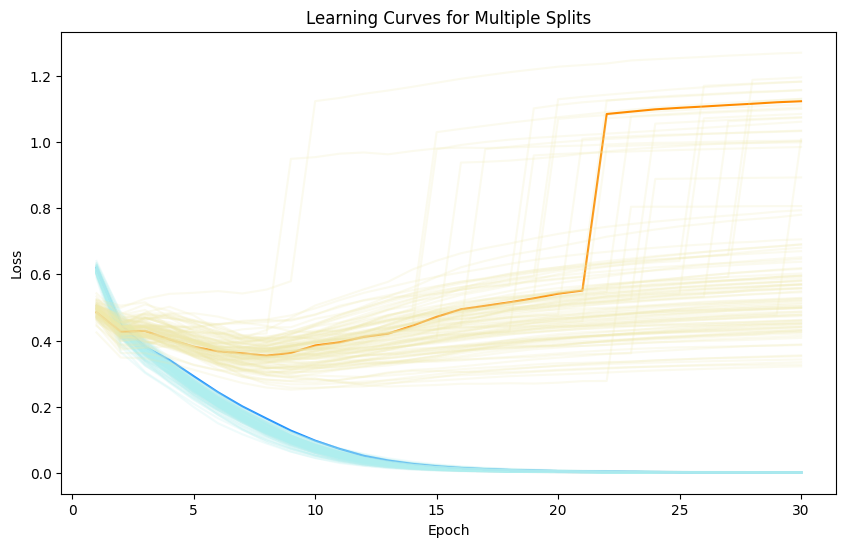

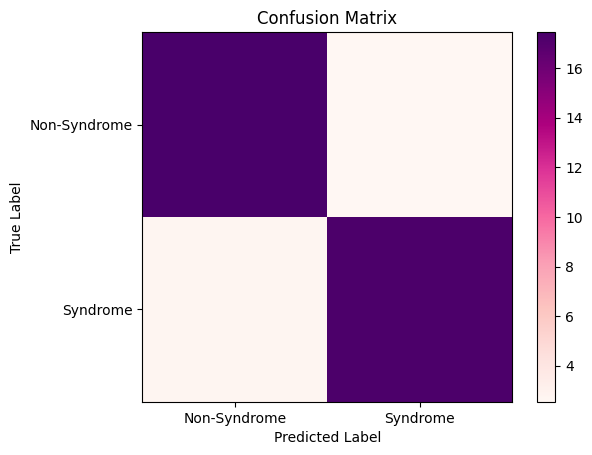

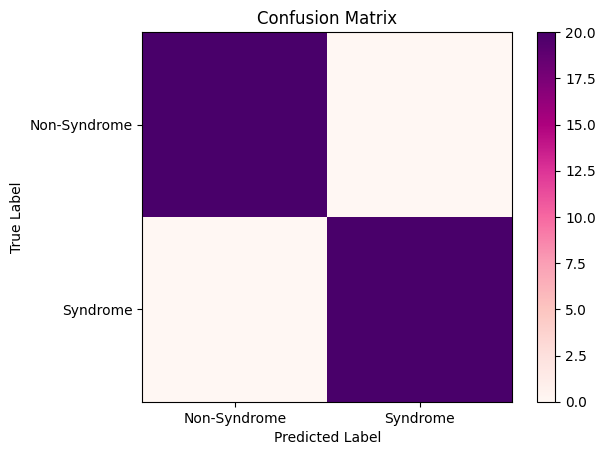

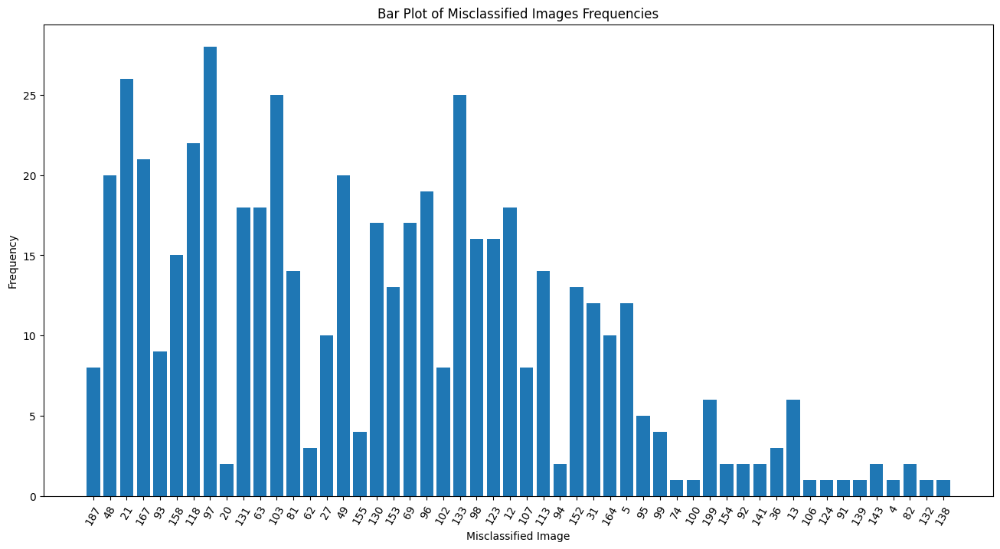

Image ID: 97, Frequency: 28
Image ID: 21, Frequency: 26
Image ID: 103, Frequency: 25
Image ID: 133, Frequency: 25
Image ID: 118, Frequency: 22
Image ID: 167, Frequency: 21
Image ID: 48, Frequency: 20
Image ID: 49, Frequency: 20
Image ID: 96, Frequency: 19
Image ID: 131, Frequency: 18
Image ID: 63, Frequency: 18
Image ID: 12, Frequency: 18
Image ID: 130, Frequency: 17
Image ID: 69, Frequency: 17
Image ID: 98, Frequency: 16
Image ID: 123, Frequency: 16
Image ID: 158, Frequency: 15
Image ID: 81, Frequency: 14
Image ID: 113, Frequency: 14
Image ID: 153, Frequency: 13
Image ID: 152, Frequency: 13
Image ID: 31, Frequency: 12
Image ID: 5, Frequency: 12
Image ID: 27, Frequency: 10
Image ID: 164, Frequency: 10
Image ID: 93, Frequency: 9
Image ID: 187, Frequency: 8
Image ID: 102, Frequency: 8
Image ID: 107, Frequency: 8
Image ID: 199, Frequency: 6
Image ID: 13, Frequency: 6
Image ID: 95, Frequency: 5
Image ID: 155, Frequency: 4
Image ID: 99, Frequency: 4
Image ID: 62, Frequency: 3
Image ID: 36, 

In [121]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
from collections import defaultdict

# Define the number of train-test splits
num_splits = 100

# Lists to store evaluation metrics and loss curves for each split
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []
all_train_avg_loss_curves = []
all_valid_avg_loss_curves = []
min_losses = []
cms = []
misclassified_images_freqs = defaultdict(int)

# Define a function to train and evaluate the model for one split
def train_and_evaluate(split_idx, data):
    print(f"Training and evaluating split {split_idx + 1}")

    indices = np.arange(len(data))
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test, _, idxs_test = train_test_split(data.drop('label', axis=1), data['label'], indices, test_size=0.2, random_state=split_idx, stratify=data['label'])
    original_test_data = data.iloc[idxs_test]

    # Standardize the features using PyTorch tensors
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Convert data to PyTorch tensors
    X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)
    X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
    y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)

    # Create datasets and dataloaders
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

    train_dataloader = DataLoader(train_dataset, batch_size=10, shuffle=True)
    test_dataloader = DataLoader(test_dataset, batch_size=40, shuffle=False)

    # Instantiate the new MLP model
    input_size = X_train.shape[1]
    hidden_size1 = 64
    hidden_size2 = 32
    output_size = 1
    mlp_model = MLP(input_size, hidden_size1, hidden_size2, output_size)

    # Define loss function and optimizer
    criterion_mlp = nn.BCELoss()
    optimizer_mlp = optim.Adam(mlp_model.parameters(), lr=0.001)

    # Train the model
    #train_losses_mlp = train_model(mlp_model, train_dataloader, criterion_mlp, optimizer_mlp, num_epochs=30)
    train_losses_mlp, val_losses_mlp = train_model_with_cross_validation(mlp_model, train_dataset, criterion_mlp, optimizer_mlp, num_epochs=30, num_folds=5)
    avg_train_losses = np.mean(train_losses_mlp, axis=0)
    avg_val_losses = np.mean(val_losses_mlp, axis=0)

    # Store the loss curve for this split
    all_train_avg_loss_curves.append(avg_train_losses)
    all_valid_avg_loss_curves.append(avg_val_losses)

    # Definite model: 5 epochs
    mlp_model = MLP(input_size, hidden_size1, hidden_size2, output_size)
    optimizer_mlp = optim.Adam(mlp_model.parameters(), lr=0.001)
    train_losses_mlp = train_model(mlp_model, train_dataloader, criterion_mlp, optimizer_mlp, num_epochs=5)

    min_loss = np.min(train_losses_mlp)
    min_losses.append(min_loss)

    # Evaluate the model
    accuracy, precision, recall, f1, cm, misclassified_images = evaluate_model(mlp_model, test_dataloader, original_test_data)
    for image_id in misclassified_images:
        misclassified_images_freqs[str(image_id)] += 1

    cms.append(cm)

    # Store evaluation metrics for this split
    accuracy_list.append(accuracy)
    precision_list.append(precision)
    recall_list.append(recall)
    f1_list.append(f1)

# Flatten the features
syndrome_features_flat = syndrome_features.reshape(syndrome_features.shape[0], -1)
non_syndrome_features_flat = non_syndrome_features.reshape(non_syndrome_features.shape[0], -1)

# Create labels for the features
syndrome_labels = np.ones(syndrome_features_flat.shape[0])
non_syndrome_labels = np.zeros(non_syndrome_features_flat.shape[0])

# Concatenate features and labels
all_features = np.concatenate([syndrome_features_flat, non_syndrome_features_flat], axis=0)
all_labels = np.concatenate([syndrome_labels, non_syndrome_labels], axis=0)

# Create a DataFrame
data = pd.DataFrame(data=all_features, columns=[f'feature_{i}' for i in range(all_features.shape[1])])
data['label'] = all_labels

# Run the training and evaluation loop for multiple splits
for split_idx in range(num_splits):
    train_and_evaluate(split_idx, data)

# Calculate and print average metrics
avg_accuracy = sum(accuracy_list) / len(accuracy_list)
avg_precision = sum(precision_list) / len(precision_list)
avg_recall = sum(recall_list) / len(recall_list)
avg_f1 = sum(f1_list) / len(f1_list)
avg_min_loss = sum(min_losses) / len(min_losses)
avg_cm = sum(cms) / num_splits

std_accuracy = np.std(np.array(accuracy_list))
std_precision = np.std(np.array(precision_list))
std_recall = np.std(np.array(recall_list))
std_f1 = np.std(np.array(f1_list))
std_min_loss = np.std(np.array(min_losses))
std_cm = np.array([[np.std([cm[0, 0] for cm in cms]), np.std([cm[0, 1] for cm in cms])],
                   [np.std([cm[1, 0] for cm in cms]), np.std([cm[1, 1] for cm in cms])]])

best_idx = np.argmax(np.array(f1_list))

best_accuracy = accuracy_list[best_idx]
best_precision = precision_list[best_idx]
best_recall = recall_list[best_idx]
best_f1 = f1_list[best_idx]
best_min_loss = min_losses[best_idx]
best_cm = cms[best_idx]

print()
print(f'Average Accuracy: {avg_accuracy:.8f}')
print(f'Average Precision: {avg_precision:.8f}')
print(f'Average Recall: {avg_recall:.8f}')
print(f'Average F1 Score: {avg_f1:.8f}')
print(f'Average Min Avg Loss: {avg_min_loss:.8f}')
print(f'Average Confusion Matrix: {avg_cm}')
print()

print(f'Std Accuracy: {std_accuracy:.8f}')
print(f'Std Precision: {std_precision:.8f}')
print(f'Std Recall: {std_recall:.8f}')
print(f'Std F1 Score: {std_f1:.8f}')
print(f'Std Min Avg Train Loss: {std_min_loss:.8f}')
print(f'Std Confusion Matrix: {std_cm}')
print()

print(f'Best Accuracy: {best_accuracy:.8f}')
print(f'Best Precision: {best_precision:.8f}')
print(f'Best Recall: {best_recall:.8f}')
print(f'Best F1 Score: {best_f1:.8f}')
print(f'Best Min Avg Train Loss: {best_min_loss:.8f}')
print(f'Best Confusion Matrix: {best_cm}')
print()

# Plot all the loss curves in one plot
plt.figure(figsize=(10, 6))
for i, loss_curve in enumerate(all_train_avg_loss_curves):
    plt.plot(range(1, len(loss_curve) + 1), loss_curve, color='dodgerblue' if i == best_idx else 'paleturquoise', alpha=1.0 if i == best_idx else 0.2)
for i, loss_curve in enumerate(all_valid_avg_loss_curves):
    plt.plot(range(1, len(loss_curve) + 1), loss_curve, color='darkorange' if i == best_idx else 'palegoldenrod', alpha=1.0 if i == best_idx else 0.2)

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Learning Curves for Multiple Splits')
plt.show()

# Plot Confusion Matrix
plt.imshow(avg_cm, interpolation='nearest', cmap=plt.cm.RdPu)
plt.title('Confusion Matrix')
plt.colorbar()
plt.xticks([0, 1], ['Non-Syndrome', 'Syndrome'])
plt.yticks([0, 1], ['Non-Syndrome', 'Syndrome'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

plt.imshow(best_cm, interpolation='nearest', cmap=plt.cm.RdPu)
plt.title('Confusion Matrix')
plt.colorbar()
plt.xticks([0, 1], ['Non-Syndrome', 'Syndrome'])
plt.yticks([0, 1], ['Non-Syndrome', 'Syndrome'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


# Convert the dictionary to lists for plotting
image_ids = list(misclassified_images_freqs.keys())
frequencies = list(misclassified_images_freqs.values())

# Set the size of the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Create a bar plot with categorical values
ax.bar(image_ids, frequencies)
ax.set_xticks(image_ids)
ax.set_xticklabels(image_ids, rotation = 60)

ax.set_xlabel('Misclassified Image')
ax.set_ylabel('Frequency')
ax.set_title('Bar Plot of Misclassified Images Frequencies')

plt.show()

# Print pairs with highest values in descending order
sorted_pairs = sorted(misclassified_images_freqs.items(), key=lambda x: x[1], reverse=True)

for image_id, frequency in sorted_pairs:
    print(f"Image ID: {image_id}, Frequency: {frequency}")

Predicted: Non-Syndrome, Actual: Syndrome, Times: 28


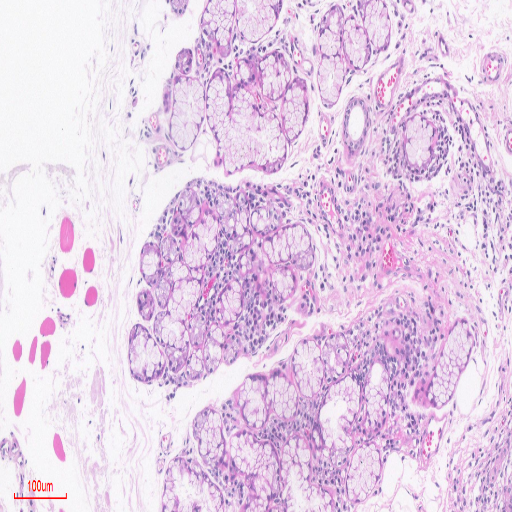

Predicted: Non-Syndrome, Actual: Syndrome, Times: 26


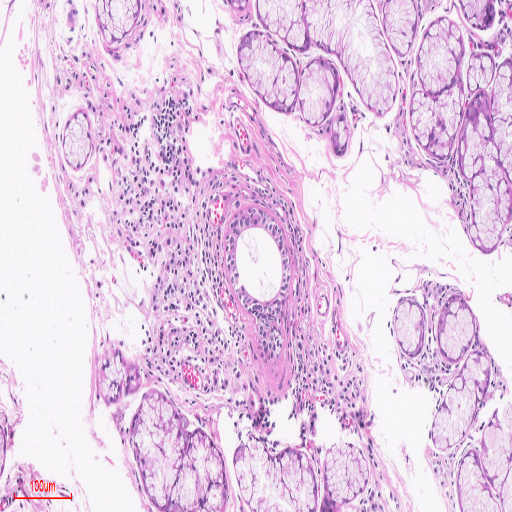

Predicted: Syndrome, Actual: Non-Syndrome, Times: 25


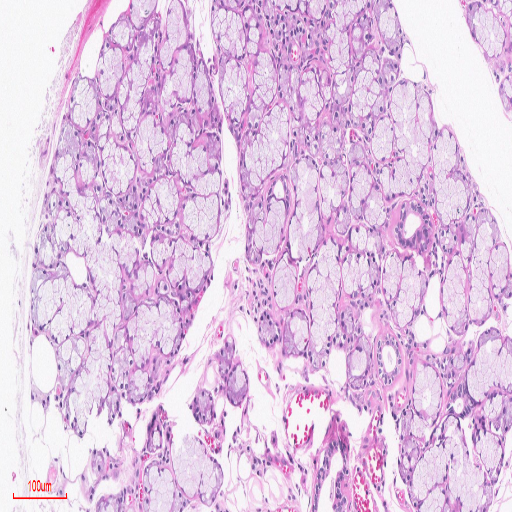

Predicted: Syndrome, Actual: Non-Syndrome, Times: 25


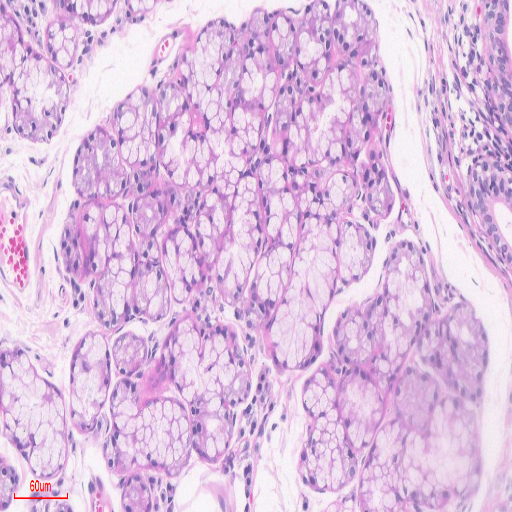

Predicted: Syndrome, Actual: Non-Syndrome, Times: 22


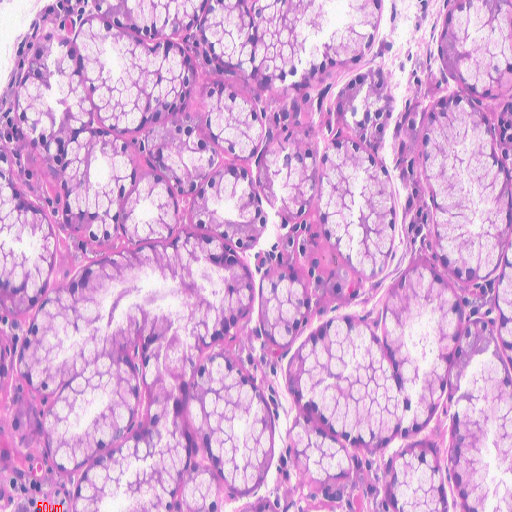

Predicted: Syndrome, Actual: Non-Syndrome, Times: 21


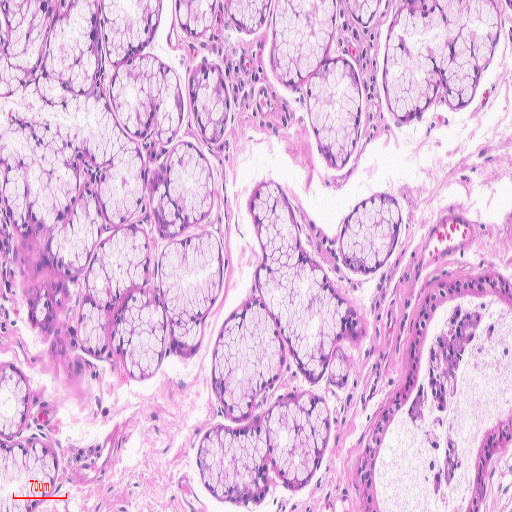

Predicted: Non-Syndrome, Actual: Syndrome, Times: 20


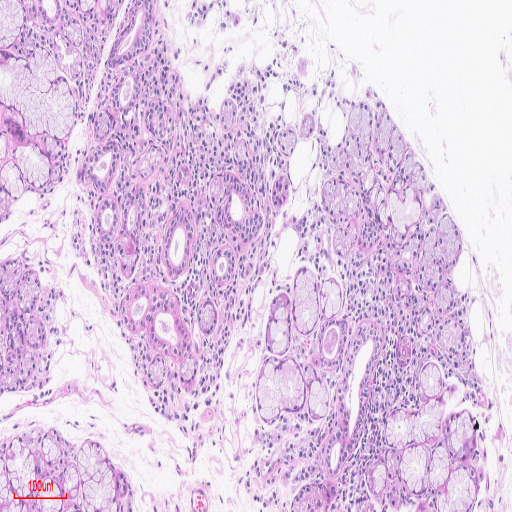

Predicted: Non-Syndrome, Actual: Syndrome, Times: 20


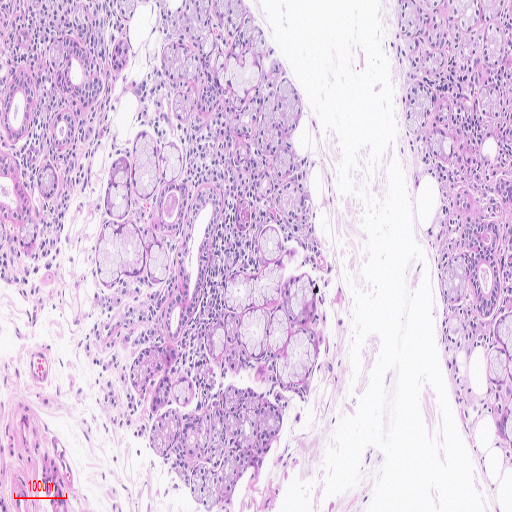

Predicted: Non-Syndrome, Actual: Syndrome, Times: 19


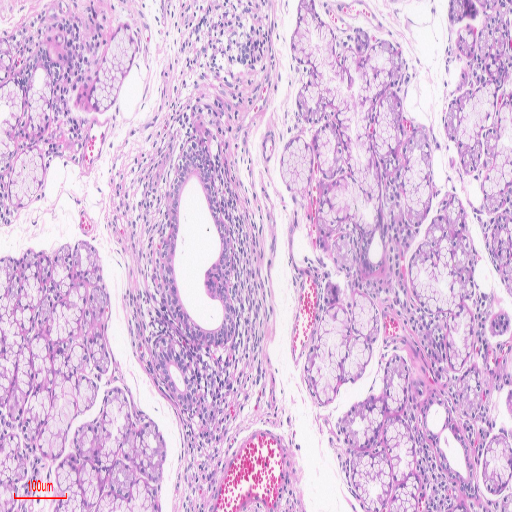

Predicted: Syndrome, Actual: Non-Syndrome, Times: 18


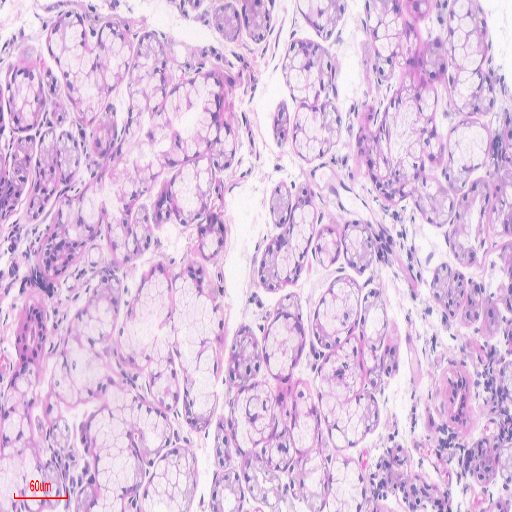

Predicted: Non-Syndrome, Actual: Syndrome, Times: 18


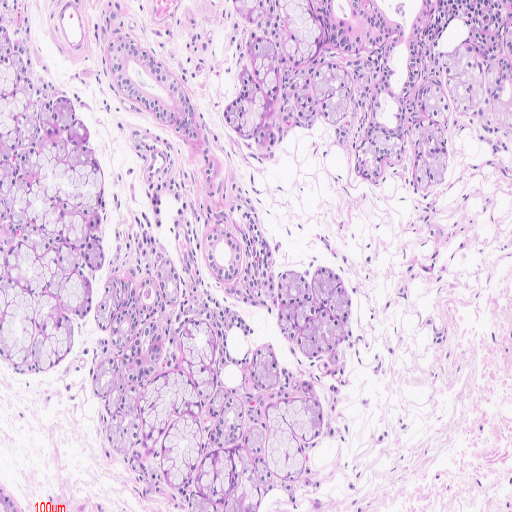

Predicted: Non-Syndrome, Actual: Syndrome, Times: 18


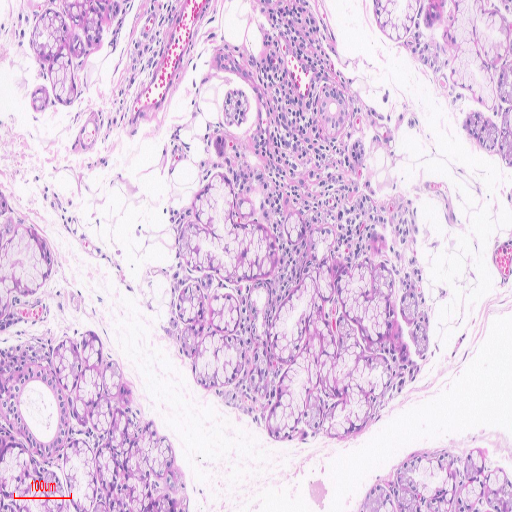

Predicted: Syndrome, Actual: Non-Syndrome, Times: 17


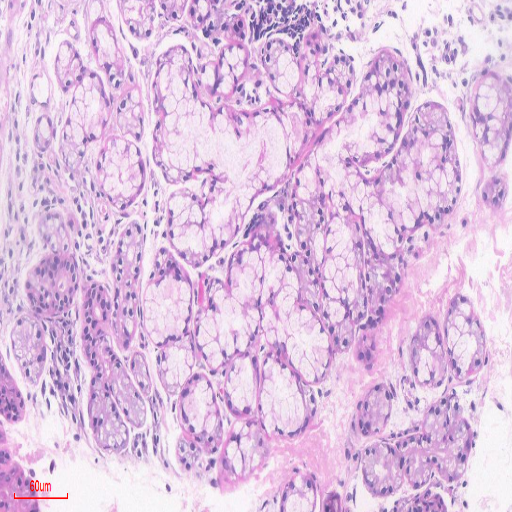

Predicted: Non-Syndrome, Actual: Syndrome, Times: 17


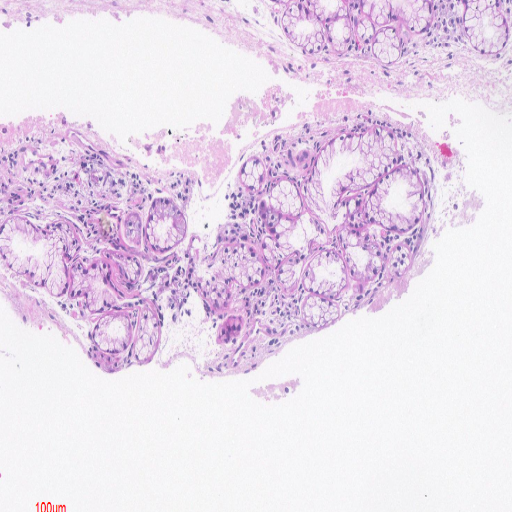

Predicted: Non-Syndrome, Actual: Syndrome, Times: 16


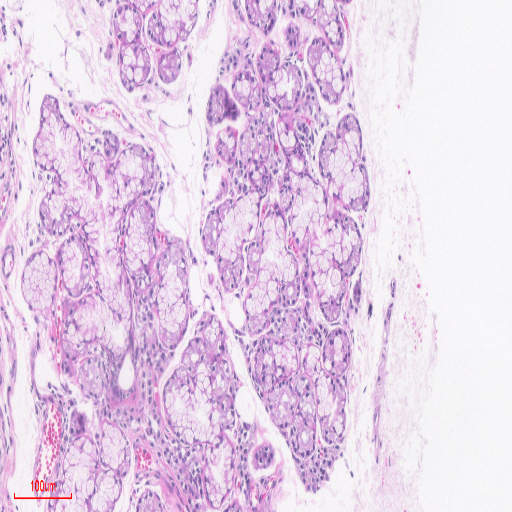

Predicted: Syndrome, Actual: Non-Syndrome, Times: 16


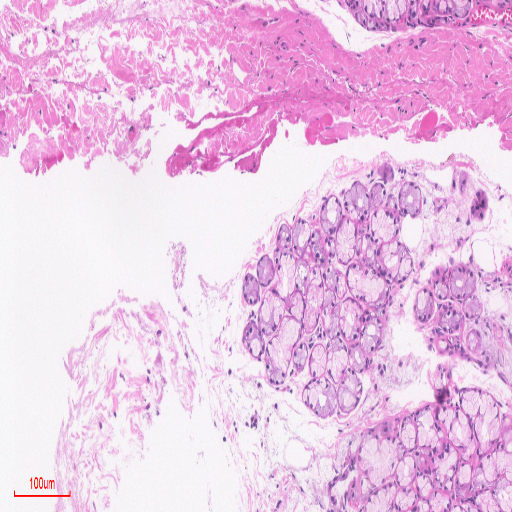

Predicted: Syndrome, Actual: Non-Syndrome, Times: 15


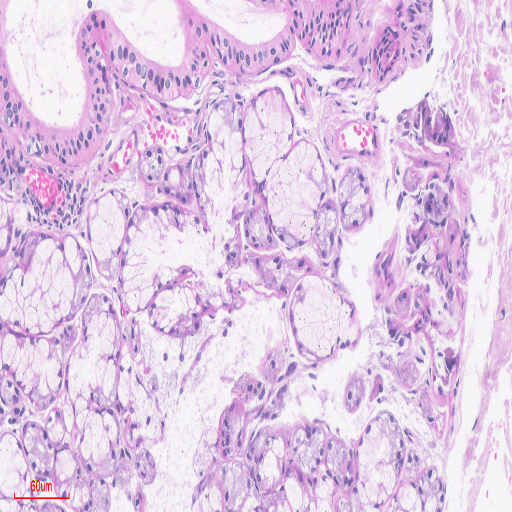

Predicted: Non-Syndrome, Actual: Syndrome, Times: 14


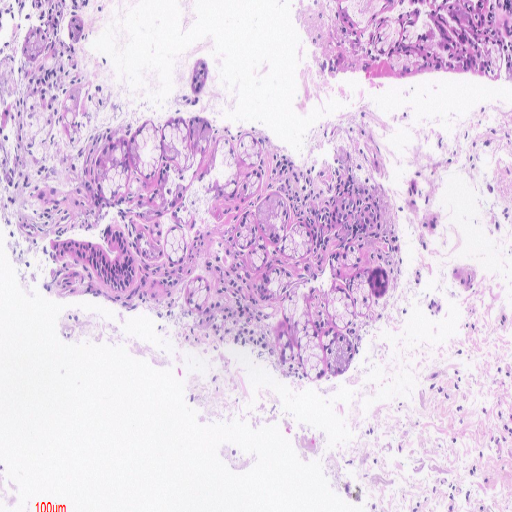

Predicted: Syndrome, Actual: Non-Syndrome, Times: 14


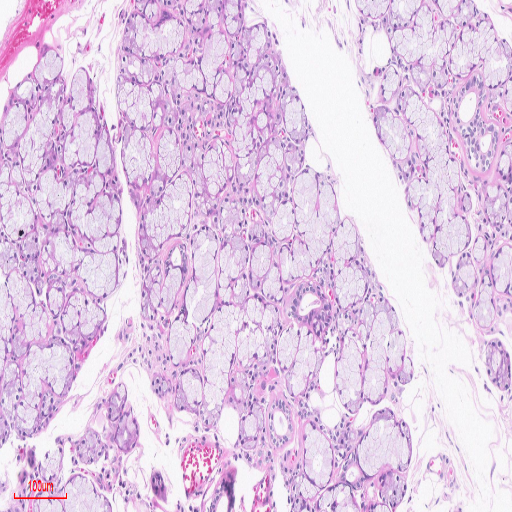

Predicted: Syndrome, Actual: Non-Syndrome, Times: 13


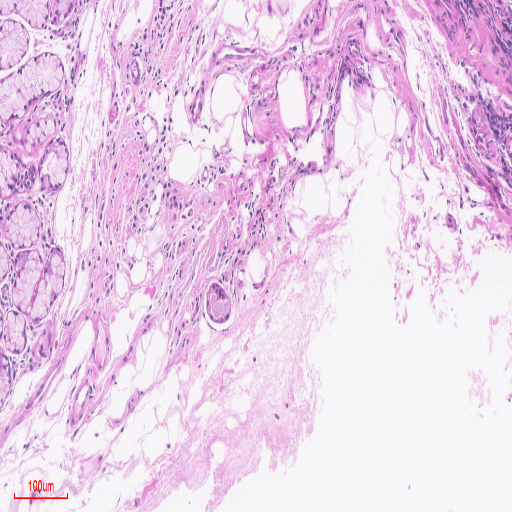

Predicted: Syndrome, Actual: Non-Syndrome, Times: 13


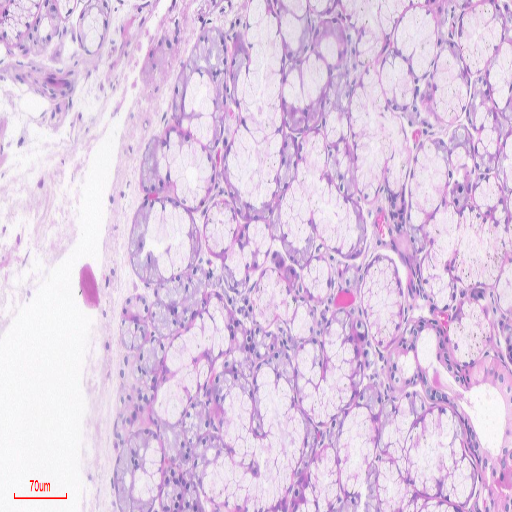

Predicted: Non-Syndrome, Actual: Syndrome, Times: 12


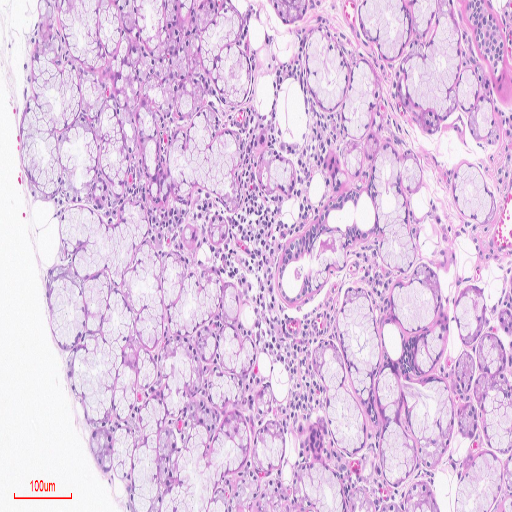

Predicted: Non-Syndrome, Actual: Syndrome, Times: 12


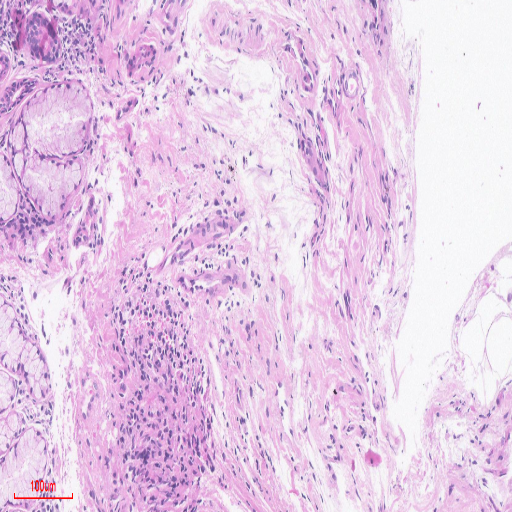

Predicted: Non-Syndrome, Actual: Syndrome, Times: 10


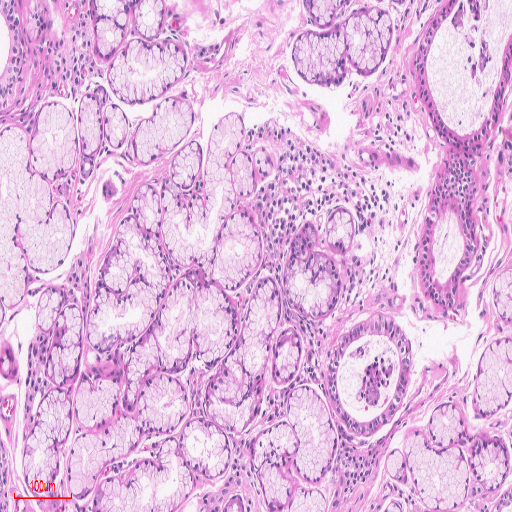

Predicted: Syndrome, Actual: Non-Syndrome, Times: 10


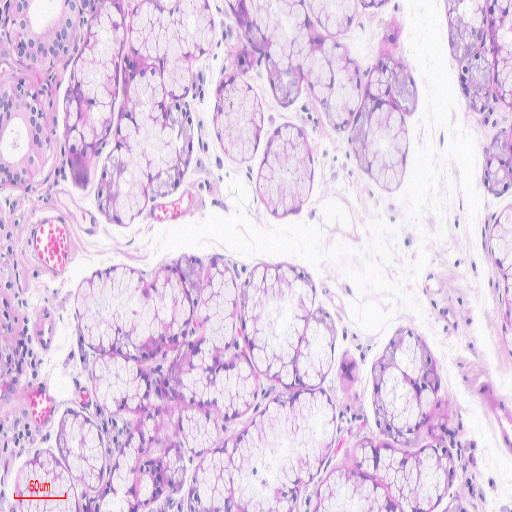

In [122]:
# Concatenate the tensors along the first dimension (assuming you want to stack them vertically)
concatenated_tensor = torch.cat([syndrome_tensor, non_syndrome_tensor], dim=0)

# Extract the first 10 image ids from the sorted pairs
top_misclassified_images = [pair[0] for pair in sorted_pairs[:25]]

# Plot the first 10 images using cv2_imshow
for image_id in top_misclassified_images:
    image = concatenated_tensor[int(image_id)].numpy().transpose((1, 2, 0))  # Assuming channels are in the last dimension
    # below only works if non syndrome arrays were always processed after syndrome arrays in the whole notebook
    print(f"Predicted: {'Non-Syndrome' if int(image_id) < 100 else 'Syndrome'}, Actual: {'Syndrome' if int(image_id) < 100 else 'Non-Syndrome'}, Times: {misclassified_images_freqs[image_id]}")
    cv2_imshow(image)